## **데이콘 뉴스 기사 레이블 복구 해커톤**

본 프로젝트는 뉴스 데이터셋의 'category'필드를 복구하는 것을 목적으로 한다.  
데이터셋은 6개의 카테고리로 분류되어야 하며, 6만 행으로 이루어진 csv 파일이다. 파일에는 'id'와 'text'필드만 있다.  
복구해야 하는 카테고리 종류는 다음과 같다.  
0: Business  
1: Entertainment  
2: Politics  
3: Sports  
4: Tech  
5: World


-------------------
Dataset Info.  
news.csv  
id : 샘플 고유 id  
title : 뉴스 기사 제목  
content : 뉴스 기사 전문  

## Sentence Transformer 주요 모델 목록

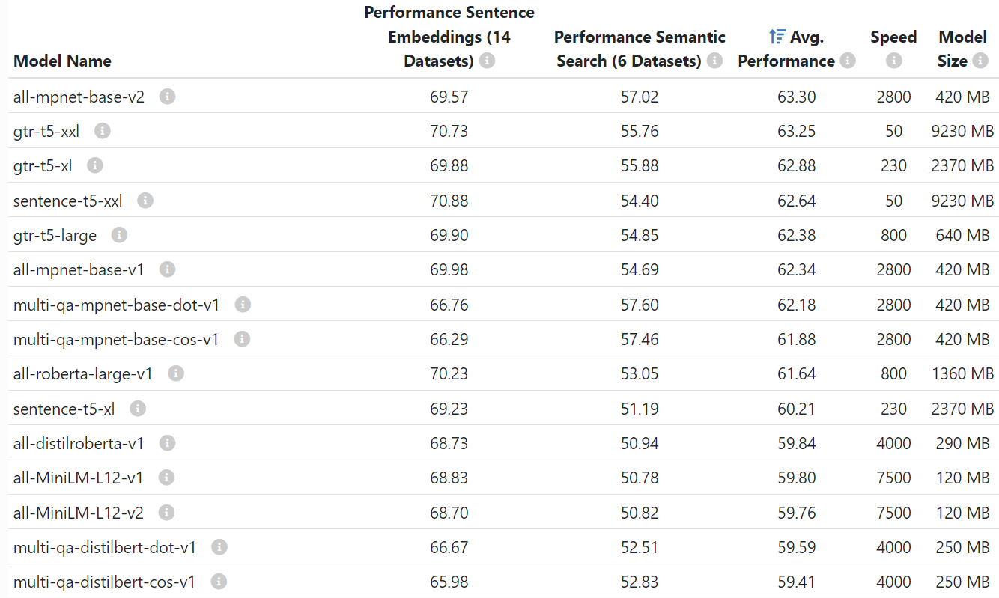

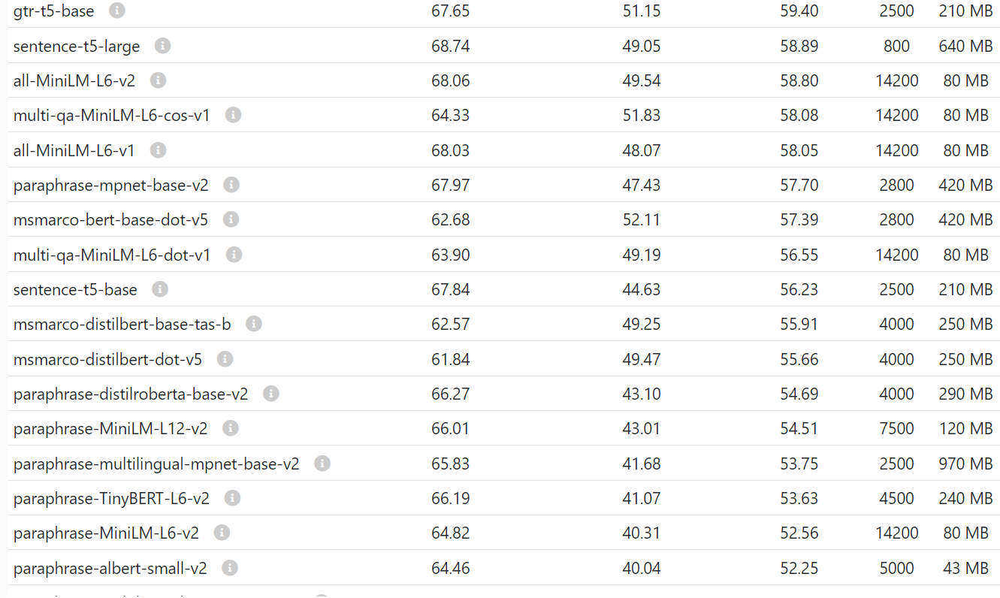

In [1]:
# GPU 사양 확인
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Tue Sep 26 00:31:23 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    44W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!pip install -U sentence-transformers

In [54]:
import re
import numpy as np
import pandas as pd
import spacy
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sentence_transformers import SentenceTransformer
from sklearn.cluster import KMeans
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings("ignore")

In [4]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

### 데이터 살펴보기(EDA)

In [5]:
df = pd.read_csv('news.csv')

In [6]:
df

,id,title,contents
0,NEWS_00000,Spanish coach facing action in race row,MADRID (AFP) - Spanish national team coach Lui...
1,NEWS_00001,Bruce Lee statue for divided city,"In Bosnia, where one man #39;s hero is often a..."
2,NEWS_00002,Only Lovers Left Alive's Tilda Swinton Talks A...,Yasmine Hamdan performs 'Hal' which she also s...
3,NEWS_00003,Macromedia contributes to eBay Stores,Macromedia has announced a special version of ...
4,NEWS_00004,Qualcomm plans to phone it in on cellular repairs,Over-the-air fixes for cell phones comes to Qu...
...,...,...,...
59995,NEWS_59995,"Dolphins Break Through, Rip Rams For First Win",But that #39;s OK. Because after a 31-14 rout ...
59996,NEWS_59996,"After Steep Drop, Price of Oil Rises",The freefall in oil prices ended Monday on a s...
59997,NEWS_59997,Pro football: Culpepper puts on a show,To say Daunte Culpepper was a little frustrate...
59998,NEWS_59998,Albertsons on the Rebound,The No. 2 grocer reports double-digit gains in...


In [7]:
df['text'] = df['title'] + ' ' + df['contents']

### 데이터 전처리(Data Preprocessing)

In [8]:
# 데이터 전처리 함수 정의
def preprocessing(text):
    # URL 제거
    text = re.sub(r'https?://\S+|www\.\S+', ' ', text, flags=re.MULTILINE)

    # 이모지 제거
    text = text.encode('ascii', 'ignore').decode('ascii')

    # 'short_description' 제거
    text = text.replace('short_description', '')

    # 소문자 변환, 특수문자 제거
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)

    # 한 글자 제거
    text = ' '.join([word for word in text.split() if len(word) > 1])

    # 숫자 제거
    text = re.sub(r'\d+', '', text)

    # 표제어 추출
    lemmatizer = WordNetLemmatizer()
    words = text.split()
    text = ' '.join([lemmatizer.lemmatize(word) for word in words])

    # 불용어 제거
    stop_words = set(stopwords.words('english'))
    words = text.split()
    text = ' '.join([word for word in words if word not in stop_words])

    return text

In [9]:
# 전처리 함수 테스트
sample_text = 'Blake Leeper may be training for the Rio 2016 Olympic Games but he found time to stop by the Samsung Smart Lounge to talk about his goals and how technology can help people like him compete at a high level.'
# sample_text = "www.huffingtonpost.com/entry/a-fair-way-to-choose-cand_b_7922194.html short_description"
result = preprocessing(sample_text)
result

'blake leeper may training rio olympic game found time stop samsung smart lounge talk goal technology help people like compete high level'

In [10]:
df['preprocessed_text'] = df['text'].apply(preprocessing)

In [11]:
df['preprocessed_text'].head()

0    spanish coach facing action race row madrid af...
1    bruce lee statue divided city bosnia one man h...
2    lover left alives tilda swinton talk almost qu...
3    macromedia contributes ebay store macromedia h...
4    qualcomm plan phone cellular repair overtheair...
Name: preprocessed_text, dtype: object

### 토큰화(Tokenization)

In [23]:
# SpaCy 영어 모델 로드
nlp = spacy.load("en_core_web_sm")

# to list
documents = df['preprocessed_text'].tolist()

def spacy_tokenizer(text):
    tokens = nlp(text)
    return [token.text for token in tokens if not token.is_space]

documents = [spacy_tokenizer(text) for text in tqdm(documents, desc="Tokenizing", leave=True, ncols=100, mininterval=1000)]

Tokenizing: 100%|████████████████████████████████████████████| 60000/60000 [08:07<00:00, 123.15it/s]


In [24]:
documents

[['spanish',
  'coach',
  'facing',
  'action',
  'race',
  'row',
  'madrid',
  'afp',
  'spanish',
  'national',
  'team',
  'coach',
  'luis',
  'aragones',
  'face',
  'formal',
  'investigation',
  'spain',
  'football',
  'federation',
  'decided',
  'open',
  'disciplinary',
  'proceeding',
  'racist',
  'comment',
  'thierry',
  'henry',
  'france',
  'arsenal'],
 ['bruce',
  'lee',
  'statue',
  'divided',
  'city',
  'bosnia',
  'one',
  'man',
  'hero',
  'often',
  'another',
  'man',
  'villain',
  'citizen',
  'decided',
  'honour',
  'one',
  'serb',
  'croat',
  'muslim',
  'look',
  'kung',
  'fu',
  'great',
  'bruce',
  'lee'],
 ['lover',
  'left',
  'alives',
  'tilda',
  'swinton',
  'talk',
  'almost',
  'quitting',
  'acting',
  'yasmine',
  'hamdan',
  'performs',
  'hal',
  'live',
  'nyc',
  'huffpo',
  'exclusive',
  'video',
  'author',
  'yasmine',
  'hamdan',
  'performs',
  'hal',
  'also',
  'sings',
  'film',
  'scene',
  'two',
  'worldweary',
  'vampi

### 임베딩(Embedding)

In [25]:
SEED = 1028

# 랜덤 시드 설정
np.random.seed(SEED)

이미 생성된 tqdm 객체가 있는지 확인
if not hasattr(tqdm, '_instances') or len(tqdm._instances) == 0:

leave=True 옵션도 주기

In [56]:
# 모델 로드
model = SentenceTransformer('all-mpnet-base-v2')

# 토큰화된 리스트를 하나의 문장으로 변환
sentences = [' '.join(tokens) for tokens in documents]

embeddings = []

if not hasattr(tqdm, '_instances') or len(tqdm._instances) == 0:
    with tqdm(total=len(sentences), desc="Encoding Texts", leave=True) as progress_bar:
        for sentence in sentences:
            # 텍스트 feature 추출
            embedding = model.encode(sentence)
            embeddings.append(embedding)
            progress_bar.update(1)  # 진행 상황 업데이트
    progress_bar.close()

# 추출한 feature를 데이터프레임에 저장
df_embeddings = pd.DataFrame(embeddings)

Encoding Texts: 100%|██████████| 60000/60000 [13:53<00:00, 71.97it/s]


In [57]:
df_embeddings.to_csv('embedding.csv', index=False)

In [ ]:
"""
model = SentenceTransformer('all-mpnet-base-v2')

# 텍스트 feature 추출
embeddings = model.encode(documents)

# 추출한 feature를 데이터프레임에 저장
df_embeddings = pd.DataFrame(embeddings)
"""

In [58]:
embeddings

[array([ 4.53301817e-02,  2.02121609e-03,  9.90212429e-03,  2.83309966e-02,
         3.53066139e-02,  2.04098616e-02, -1.87467355e-02,  3.18739600e-02,
         1.55823110e-02, -2.98054758e-02, -2.83032004e-02,  6.67968467e-02,
         1.11006340e-02, -1.01640768e-01,  8.48498009e-03,  6.17999472e-02,
        -3.00003085e-02, -7.42442254e-03, -6.21492136e-03, -5.04832901e-02,
         4.40955721e-02,  1.67839639e-02,  4.18129265e-02,  2.86057442e-02,
        -1.91879664e-02,  3.67962383e-02, -6.50255987e-03, -4.48299125e-02,
         1.87410749e-02,  5.06471656e-02, -2.11428422e-02,  1.32695986e-02,
        -3.02536041e-02, -2.04786938e-02,  1.63708876e-06, -2.82721631e-02,
        -5.21781705e-02, -1.44029567e-02,  7.40113705e-02, -3.78506295e-02,
         5.56337610e-02, -2.37910021e-02,  6.30752742e-03,  3.86537868e-04,
         2.26988886e-02,  4.27171700e-02,  2.56509315e-02,  3.29070389e-02,
         8.16516578e-02,  4.61478811e-03,  9.30678658e-03, -2.68045273e-02,
         6.0

In [59]:
df_embeddings

,0,1,2,3,4,5,6,7,8,9,...,758,759,760,761,762,763,764,765,766,767
0,0.045330,0.002021,0.009902,0.028331,0.035307,0.020410,-0.018747,0.031874,0.015582,-0.029805,...,-0.021822,-0.047717,-0.057863,0.049814,-0.010271,-0.034176,-0.041642,0.015593,0.005855,-0.017390
1,0.046881,0.039420,-0.008161,0.061394,-0.012252,0.006286,0.085440,0.001925,0.039701,0.035816,...,0.017644,0.018428,-0.016250,0.007575,-0.014948,-0.115936,0.013149,-0.011757,-0.019778,-0.019050
2,0.061527,-0.013485,0.006328,-0.011316,0.058261,0.032626,-0.024874,-0.019752,-0.042862,-0.000473,...,0.051694,0.032383,0.056513,-0.017322,-0.009658,0.011160,0.066155,-0.005694,0.056180,-0.021009
3,0.048112,-0.006568,-0.029522,-0.049038,0.019210,0.018787,0.060224,0.023660,-0.081550,-0.027585,...,0.012476,0.022653,0.026730,0.023147,-0.039711,0.036026,-0.050404,-0.023258,-0.048717,-0.050949
4,-0.027155,0.010349,-0.041713,-0.050214,0.037844,0.020349,0.000802,0.019957,-0.058100,0.019171,...,0.029119,0.010524,0.040468,-0.019704,0.003805,0.052615,0.044116,-0.016816,-0.022523,-0.035988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,-0.049908,0.034788,-0.004791,-0.068915,0.023784,0.033451,-0.020441,-0.013870,-0.069074,-0.050301,...,-0.041398,0.041355,0.023300,-0.010027,-0.022831,0.059510,-0.018599,0.027990,0.004786,-0.014132
59996,-0.042918,0.044046,0.003202,-0.003204,-0.018593,-0.033756,-0.008856,0.015870,-0.008901,-0.002298,...,-0.012462,0.009298,0.067793,0.034133,0.004264,-0.017176,0.028119,-0.065497,-0.015092,-0.016216
59997,-0.080981,0.030641,0.011520,-0.030402,-0.029842,0.020584,-0.015583,0.058900,-0.048960,-0.041767,...,-0.012207,0.052646,-0.017324,-0.048996,-0.016554,0.068194,-0.015224,0.041879,0.043273,-0.021356
59998,-0.004220,0.059579,0.000718,0.028949,0.036747,-0.013289,-0.019359,-0.000822,0.033240,-0.023304,...,-0.004057,-0.005459,0.059420,0.035968,0.008080,-0.095885,0.028447,-0.015732,-0.007893,-0.014873


In [61]:
# K-Means 클러스터링 모델 훈련
cluster_model= KMeans(n_clusters=6, random_state=SEED)
df['kmeans_cluster'] = cluster_model.fit_predict(embeddings)

### 클러스터 시각화(Visualization)

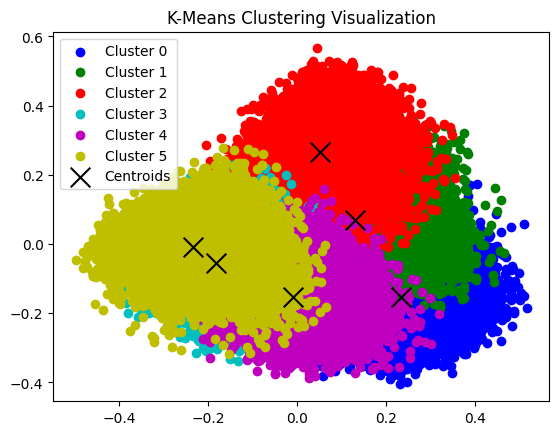

In [62]:
# 클러스터 시각화
num_clusters = 6
cluster_labels = df['kmeans_cluster']

# 데이터를 2차원으로 축소 (PCA 사용)
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(df_embeddings)

# 각 클러스터 색상 지정
colors = ['b', 'g', 'r', 'c', 'm', 'y']

# 클러스터 시각화
for cluster_num in range(num_clusters):
    cluster_data = reduced_data[cluster_labels == cluster_num]
    plt.scatter(cluster_data[:, 0], cluster_data[:, 1], c=colors[cluster_num], label=f'Cluster {cluster_num}')

# 클러스터 중심 시각화
cluster_centers = pca.transform(kmeans.cluster_centers_)
# X좌표, y좌표
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], c='k', marker='x', s=200, label='Centroids')

plt.title('K-Means Clustering Visualization')
plt.legend()
plt.show()

In [63]:
# 각 클러스터의 데이터 개수
cluster_counts = df['kmeans_cluster'].value_counts()
print(cluster_counts)

2    11464
3    10880
0    10104
4     9641
1     9095
5     8816
Name: kmeans_cluster, dtype: int64


0: Business  
1: Entertainment  
2: Politics  
3: Sports  
4: Tech  
5: World

### 데이터 후처리(Data Post Processing)

### 0 -> : 2: Politics

In [64]:
df[df['kmeans_cluster'] == 0]['text'].head(10)

8     Obama Marks Anniversary Of 9/11 Attacks With M...
9     Republican Congressman Says Trump Should Apolo...
11    Kerry rolls out tax-cut plan for middle class ...
12    Read Live Updates From The South Carolina Demo...
14    Obama Administration Helps Wall Street Crimina...
15    It's Not As Easy As You Think To Spot A Gerrym...
16    Fischer's Fiancee: Marriage Plans Genuine (AP)...
17    Parents Of School Shooting Victims Decry 'Moro...
18    A Fair Way to Choose Candidates for Republican...
19    Congress Spikes Handout For Private Equity aut...
Name: text, dtype: object

In [65]:
print(df['text'][8])
print(df['text'][11])
print(df['text'][14])
print(df['text'][15])
print(df['text'][17])

Obama Marks Anniversary Of 9/11 Attacks With Moment Of Silence authors We stand as strong as ever.
Kerry rolls out tax-cut plan for middle class After two weeks of focusing on Iraq, Democratic presidential challenger John Kerry turned his emphasis to the economy Saturday, delivering what he called a plan for  quot;middle-class families.
Obama Administration Helps Wall Street Criminals Dodge Accountability authors Obama administration proposal would aid big banks that have pleaded guilty to felony antitrust charges.
It's Not As Easy As You Think To Spot A Gerrymandered Map authors Our electoral districts have really weird shapes. Figuring out if they're gerrymandered takes some deeper digging.
Parents Of School Shooting Victims Decry 'Moronic' GOP Platitudes authors For [Texas Lt. Gov. Dan Patrick] to be making those moronic comments? Unacceptable.u201d


### 1 -> 1: Entertainment

In [66]:
df[df['kmeans_cluster'] == 1]['text'].head(10)

1     Bruce Lee statue for divided city In Bosnia, w...
2     Only Lovers Left Alive's Tilda Swinton Talks A...
10    Harry #39;s argy-bargy PRINCE Charles has aske...
21    Blake Leeper Wants to Be the First American Pa...
25    Be on TOP //www.huffingtonpost.com/entry/be-on...
28    Cate Blanchett Set To Star As Lucille Ball In ...
45    The Trouble with Broadcasting in a Social Worl...
62    John Waters' Women at the Film Society of Linc...
64    Jon Voight Is 'Concerned' About Daughter Angel...
68    Satire Will Not Save Us //www.huffingtonpost.c...
Name: text, dtype: object

In [67]:
print(df['text'][1])
print(df['text'][2])
print(df['text'][25])
print(df['text'][62])
print(df['text'][68])

Bruce Lee statue for divided city In Bosnia, where one man #39;s hero is often another man #39;s villain, some citizens have decided to honour one whom Serbs, Croats and Muslims can all look up to - the kung fu great Bruce Lee.
Only Lovers Left Alive's Tilda Swinton Talks About Almost Quitting Acting and Yasmine Hamdan Performs 'Hal' Live In NYC   (HuffPo Exclusive Videos) authors Yasmine Hamdan performs 'Hal' which she also sings in the film during a scene when two world-weary vampires begin to heal and find a way to continue living as they remember the power and mystery of creation itself.
Be on TOP //www.huffingtonpost.com/entry/be-on-top-amazon-best-sel_b_12508618.html short_description
John Waters' Women at the Film Society of Lincoln Center authors No one missed the irony of a John Waters retrospective at The Walter Reade Theater across Lincoln Center's plaza from Fashion Week.
Satire Will Not Save Us //www.huffingtonpost.com/entry/tal-fortgang-satire-will-not-save-us_b_5283369.h

### 2 -> 3: Sports

In [68]:
df[df['kmeans_cluster'] == 2]['text'].head(10)

0     Spanish coach facing action in race row MADRID...
6     Time to Talk Baseball It's time to talk about ...
13    GAME DAY PREVIEW Game time: 6:00 PM CHARLOTTE,...
22    College Basketball: Georgia Tech, UConn Win AT...
24    Kentucky Fan Gets National Champs Tattoo. Let'...
26    Doping case was flawed, report finds MONTREAL ...
30    Montgomerie Beats Woods in S. Korean Skins (AP...
38    Longhorns Rip Cowboys Cedric Benson scores fiv...
39    Ricky Williams ordered to repay Dolphins Forme...
40    Out for V-I-C-T-O-R-Y, but Missing Tiles Missi...
Name: text, dtype: object

In [69]:
print(df['text'][13])
print(df['text'][26])
print(df['text'][38])
print(df['text'][39])
print(df['text'][40])

GAME DAY PREVIEW Game time: 6:00 PM CHARLOTTE, North Carolina (Ticker) -- The Detroit Shock face a critical road test Saturday when they take on the Charlotte Sting at Charlotte Coliseum.
Doping case was flawed, report finds MONTREAL A series of errors and misunderstandings led to the botched drug test that resulted in Tyler Hamilton, the American cyclist, retaining his gold medal from the Athens Olympics, the World Anti-Doping Agency has said in a report.
Longhorns Rip Cowboys Cedric Benson scores five touchdowns on Saturday night, highlighting a 49-point rally that sends No. 6 Texas to a stunning 56-35 win over No. 19 Oklahoma State.
Ricky Williams ordered to repay Dolphins Former Miami Dolphins running back Ricky Williams was ordered Friday to repay the team more than \$8.6 million. The money was for incentives and a signing bonus, an arbitrator said.
Out for V-I-C-T-O-R-Y, but Missing Tiles Missing a key piece to your favorite board game? The Web's abundance of board game sites mig

### 3 -> 0: Business

In [70]:
df[df['kmeans_cluster'] == 3]['text'].head(10)

7      Bump Stock Maker Resumes Sales One Month After...
20     Deere's Color Is Green With big tractors, big ...
27     Kmart-Sears merger about price, quality Averag...
61     Typhoon-Like Gusts Hit Japan; 13 Injured TOKYO...
70     ABN Amro Profit Rises, Buoyed by Sale of Asia ...
85     Stocks to Open Higher on Growth Outlook NEW YO...
98     Producer Prices Up 0.1 Pct, Energy Drops (Reut...
99     Rigel, Merck Form Development Partnership NEW ...
102    A Lot Of Managers Want to Raise The Minimum Wa...
103    Nortel attempts to calm fears of possible stoc...
Name: text, dtype: object

In [71]:
print(df['text'][7])
print(df['text'][27])
print(df['text'][61])
print(df['text'][98])
print(df['text'][103])

Bump Stock Maker Resumes Sales One Month After Las Vegas Mass Shooting authors Move along nothing to see here.
Kmart-Sears merger about price, quality Average customers know the same thing that ministers of high finance understand: It #39;s all about the price. Shoppers Thursday at the Billings Sears store were eager to find out what a proposed
Typhoon-Like Gusts Hit Japan; 13 Injured TOKYO - Gale-force winds pounded eastern Japan early Sunday, knocking out power to homes, stirring coastal waves that caused a tanker ship to run aground and injuring at least 13 people.
Producer Prices Up 0.1 Pct, Energy Drops (Reuters) Reuters - U.S. producer prices edged up just\0.1 percent in September, held back by a big energy-price drop,\but the cost of non-energy items picked up steam, a government\report showed on Friday.
Nortel attempts to calm fears of possible stock delisting Nortel Networks Ltd. said both the New York Stock Exchange and the Toronto Stock Exchange are not considering delisting

### 4 -> 5: World

In [72]:
df[df['kmeans_cluster'] == 4]['text'].head(10)

29    Israel Kills 3 Palestinians in Big Gaza Incurs...
34    The Folly of the Sole Superpower Writ Small au...
37    Deep Impact Space Probe Aims to Slam Into Come...
49    Bribery Considered, Halliburton Notes Suggest ...
51    Oil Falls Below \$49 on Nigeria Cease-Fire LON...
56    Sadr #39;s aide denies entering of Iraqi polic...
57    Former Nazi Guard Loses Canadian Court Ruling ...
59    Afghanistan Death Toll in 2004 Up to 957 KANDA...
60    Portugal PM, Cabinet Submit Resignations LISBO...
63    Family appeals for release of UK hostage The f...
Name: text, dtype: object

In [73]:
print(df['text'][29])
print(df['text'][34])
print(df['text'][51])
print(df['text'][60])
print(df['text'][63])

Israel Kills 3 Palestinians in Big Gaza Incursion (Reuters) Reuters - Israeli forces killed three\Palestinians, including two teenagers, on Wednesday after\storming into the northern Gaza Strip for the third time in as\many months to quell Palestinian rocket fire into Israel.
The Folly of the Sole Superpower Writ Small authors Think of this as a little imperial folly up -- and here's the backstory. In the years after invading Iraq and disbanding Saddam Hussein's military the U.S. sunk about $25 billion into standing up a new Iraqi army.
Oil Falls Below \$49 on Nigeria Cease-Fire LONDON (Reuters) - Oil prices dropped from record highs  above \$50 a barrel on Wednesday as the U.S. government reported  a surprise increase in crude stocks and rebels in Nigeria's  oil-rich delta region agreed a cease-fire.
Portugal PM, Cabinet Submit Resignations LISBON (Reuters) - Portugal's prime minister said on  Saturday he and his cabinet had submitted their resignations, a  move that came a day after 

### 5 -> 4: Tech

In [75]:
df[df['kmeans_cluster'] == 5]['text'].head(10)

3     Macromedia contributes to eBay Stores Macromed...
4     Qualcomm plans to phone it in on cellular repa...
5     Thomson to Back Both Blu-ray and HD-DVD Compan...
23    FTC Files First Lawsuit Against Spyware Concer...
31    Sony PSP Draws Crowds and Lines on First Day (...
41    Photos from MacExpo 2004 With over 100 exhibit...
50    UN Predicts Boom In Robot Labor The use of rob...
52    Amazon's Next Kindle May Have Better Battery L...
73    Delphi, XM Unveil Handheld Satellite Radio Rec...
79    Suit by Cities Says Microsoft Overcharged icro...
Name: text, dtype: object

In [77]:
print(df['text'][3])
print(df['text'][5])
print(df['text'][50])
print(df['text'][52])
print(df['text'][79])

Macromedia contributes to eBay Stores Macromedia has announced a special version of its Contribute website editing application designed to simplify the creation and customisation of eBay Stores.
Thomson to Back Both Blu-ray and HD-DVD Company, one of the core backers of Blu-ray, will also support its rival format.
UN Predicts Boom In Robot Labor The use of robots around the home to mow lawns, vacuum floors and manage other chores is set to surge sevenfold by 2007 as more consumers snap up smart machines, the United Nations said.
Amazon's Next Kindle May Have Better Battery Life authors Amazon says the new e-reader is coming soon.
Suit by Cities Says Microsoft Overcharged icrosoft, which has agreed to pay \$1.8 billion to settle consumer antitrust suits, has been sued by California munciplaties, including Los Angeles and San Francisco, over claims that the company overcharged them for its Windows software.


In [79]:
# 올바른 레이블로 매핑하기
mapping_dict = {
    0: 2,
    1: 1,
    2: 3,
    3: 0,
    4: 5,
    5: 4
}

In [80]:
df['mapping'] = df['kmeans_cluster'].apply(lambda x: mapping_dict[x])

In [82]:
result_df = pd.read_csv('sample_submission.csv')

In [85]:
result_df['category'] = df['mapping'].values
result_df['category'].head(20)

0     3
1     1
2     1
3     4
4     4
5     4
6     3
7     0
8     2
9     2
10    1
11    2
12    2
13    3
14    2
15    2
16    2
17    2
18    2
19    2
Name: category, dtype: int64

In [86]:
result_df.to_csv('final_submission.csv', index=False)